# Visualize the single visibility

## Data load

### Landmarks detected

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point, LineString
from pyproj import Transformer, Proj
import os
import glob
import shutil
from pyproj import Proj, transform
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import osmnx as ox
from networkx import closeness_centrality
#import momepy
## Import SVI location points in central london
import pandas as pd
from shapely.wkt import loads

In [2]:
SVI_polints_gdf_infered = gpd.read_file('data/graph_building/london_10_landmarks/0114_inference_result_london_10_landmarks.gpkg')

In [98]:
SVI_polints_gdf_infered['query'].unique()

array(['big_ben', 'gherkin', 'london_eye', 'st_paul', 'tower_bridge',
       'the_shard', 'london_tower', 'tate_modern', 'belfast',
       'walkie_talkie'], dtype=object)

big_ben: 141 detected points
gherkin: 305 detected points
london_eye: 142 detected points
st_paul: 159 detected points
tower_bridge: 95 detected points
the_shard: 464 detected points
london_tower: 46 detected points
tate_modern: 192 detected points


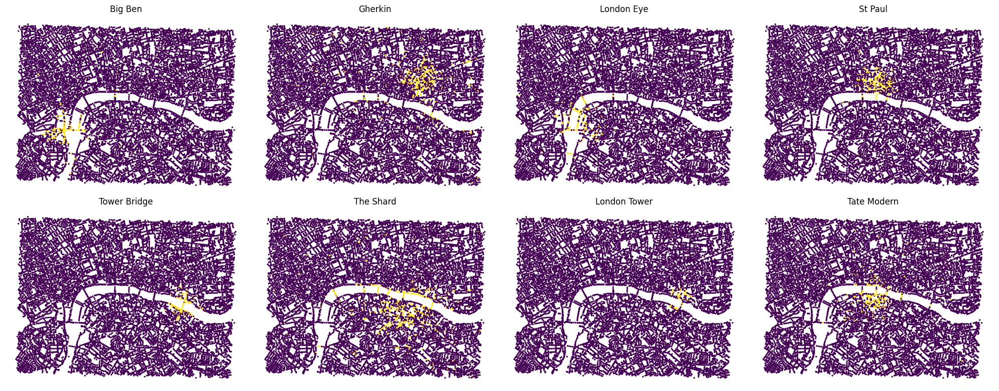

In [28]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.affinity import rotate

# Create a 2x4 subplot layout
fig, axs = plt.subplots(2, 4, figsize=(20, 8))
landmarks = SVI_polints_gdf_infered['query'].unique()[:8]

# Iterate through each landmark and plot in corresponding subplot
for idx, landmark in enumerate(landmarks):
    row = idx // 4
    col = idx % 4

    # Get data for current landmark
    results_gdf_landmark = SVI_polints_gdf_infered[SVI_polints_gdf_infered['query'] == landmark].copy()
    
    # Add color_id
    results_gdf_landmark['color_id'] = 0
    results_gdf_landmark.loc[results_gdf_landmark.detected == "tensor(True, device='cuda:0')", 'color_id'] = 1

    # Plot in corresponding subplot
    results_gdf_landmark.plot(ax=axs[row, col], column='color_id', markersize=2)
    
    # Set subplot title and style
    axs[row, col].set_title(f'{landmark.replace("_", " ").title()}')
    axs[row, col].set_axis_off()
    
    # Print number of detected points
    detected_count = len(results_gdf_landmark[results_gdf_landmark.color_id != 0])
    print(f"{landmark}: {detected_count} detected points")

# Adjust spacing between subplots
plt.tight_layout()
plt.show()


### Road Network

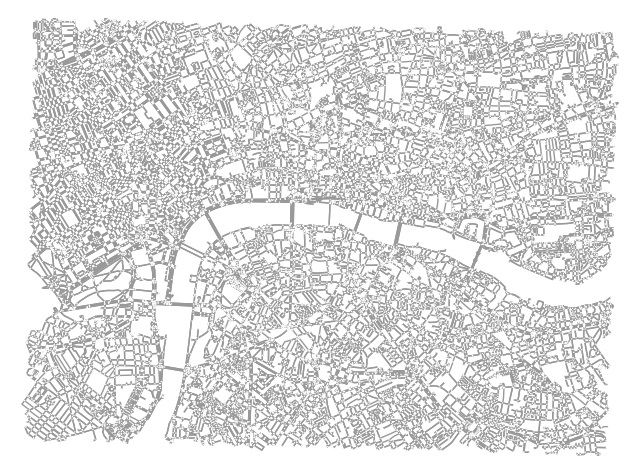

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [29]:
# Load the boundary file
import osmnx as ox


graph = ox.load_graphml('data/graph_building/london_10_landmarks/London_case_boundary_road_network.graphml')
        

ox.plot_graph(graph, node_size=1, edge_linewidth=1, bgcolor='w')



In [40]:
# extract only edges data from the road network and convert it as geodataframe
edges = ox.graph_to_gdfs(ox.get_undirected(graph), nodes=False, edges=True,
                                   node_geometry=False, fill_edge_geometry=True)
edges = edges.to_crs(27700).reset_index()

### Visualize both visible locations and background network (The shard)

In [33]:
# create a location poin for the shard
from shapely.geometry import Point
# Define the coordinates
latitude = 51.50462497710506
longitude = -0.08652726915106525
# Create a Point geometry
point_geometry = Point(longitude, latitude)
# Create a GeoDataFrame with the Point geometry
the_shard_gdf = gpd.GeoDataFrame(geometry=[point_geometry], crs="EPSG:4326").to_crs(27700)
the_shard_gdf.geometry = the_shard_gdf .geometry.buffer(3000)
the_shard_gdf['landmark'] = 'the_shard'


In [38]:
the_shard_gdf = the_shard_gdf.to_crs(27700)

edges_3000m = edges.copy()

for idx, row in edges_3000m.iterrows():   
    if isinstance(row['osmid'], int):
        # If 'osmid' is an integer, ensure it is handled as such
        edges_3000m['osmid'][idx] =str(row['osmid']) 
    
    if isinstance(row['osmid'], list):
    # Convert list to tuple (which is hashable) or to a string
       edges_3000m['osmid'][idx] = tuple(row['osmid'])  
        
def normalize_osmid(osmid):
    if isinstance(osmid, tuple):
        return ','.join(map(str, osmid))  # Convert tuple to comma-separated string
    return str(osmid)

edges_3000m['osmid'] = edges_3000m['osmid'].apply(normalize_osmid) 
edges_3000m = edges_3000m.dissolve(by='osmid', aggfunc='sum', as_index=False)

C:\Users\zicheng\AppData\Local\Temp\ipykernel_12576\3961346909.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edges_3000m['osmid'][idx] =str(row['osmid'])
C:\Users\zicheng\AppData\Local\Temp\ipykernel_12576\3961346909.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edges_3000m['osmid'][idx] = tuple(row['osmid'])
C:\Users\zicheng\AppData\Local\Temp\ipykernel_12576\3961346909.py:20: FutureWarning: The default value of numeric_only in aggfunc='sum' within pandas.DataFrameGroupBy.agg used in dissolve is deprecated. In pandas 2.0, numeric_only will default to False. Either specify numeric_only as additional argume

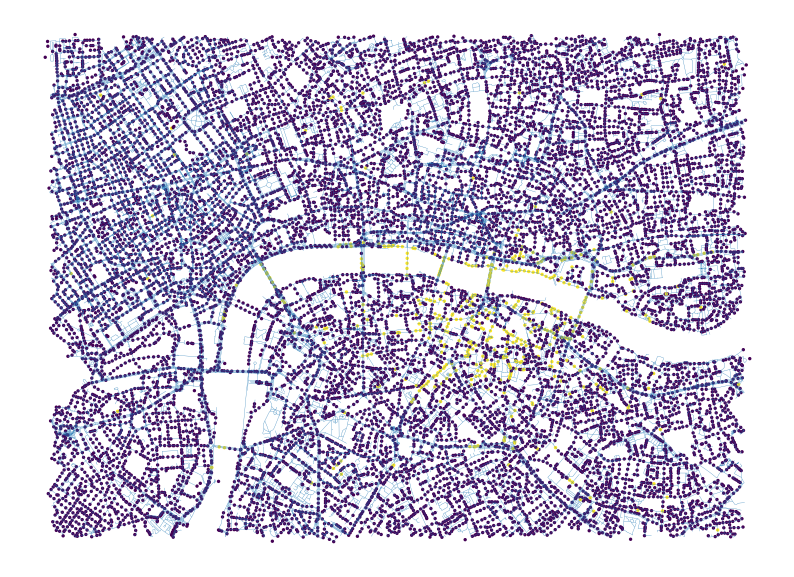

In [43]:
f, ax = plt.subplots(figsize=(10, 10))
edges_3000m.plot(ax=ax, linewidth=0.2)
#the_shard_gdf.plot(color = 'lightblue', ax=ax,alpha = 0.1)
results_gdf.to_crs(27700).plot(ax=ax, column= 'color_id', markersize=2)
ax.set_axis_off()
plt.show()

### SVI and the road it belongs to

In [60]:
edges_3000m_SVI = gpd.sjoin_nearest(results_gdf.to_crs(27700),edges_3000m[['geometry','osmid']] ).drop_duplicates('pano_id').reset_index()
edges_3000m_SVI

,index,Unnamed: 0,pano_id,pano_lat,pano_lon,heading,roll,pitch,sampling_lat,sampling_lon,...,year,image_path,query,boxes,scores,detected,geometry,color_id,index_right,osmid
0,5,0,RCCRJuO_407FLaVim6Wf2w,51.492687,-0.098575,5.884931,6.268285,-0.002289,51.492724,-0.098580,...,2024,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (532097.545 178796.045),0,1522,1069976330
1,119195,11919,Zk9wl9JBIAmQVJ_TUq2Yrw,51.492504,-0.098413,2.798081,6.279795,0.005488,51.492527,-0.098452,...,2024,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (532109.315 178775.987),0,1522,1069976330
2,15,1,AHMTKIewy7zIa0io4B7VwQ,51.492645,-0.098194,4.322697,0.107711,0.170834,51.492724,-0.098227,...,2023,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (532124.131 178792.042),0,19113,455952981
3,12735,1273,cdCJstBp7iqjwdxtGS_Aag,51.492802,-0.097830,4.207063,0.067347,0.218833,51.492562,-0.097510,...,2023,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (532148.960 178810.181),0,19113,455952981
4,57565,5756,YZbZIUz6tDanhVzIs1DwIw,51.492834,-0.097553,1.358105,0.061469,0.157925,51.492938,-0.097682,...,2023,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (532168.061 178814.227),0,19113,455952981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14474,144705,14470,Nfj9gu-bougsvFO5QSo04A,51.494554,-0.100742,6.089055,6.258370,0.008322,51.494540,-0.100907,...,2024,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (531941.757 178999.763),0,25868,"8032768,243978521,38893561"
14475,144725,14472,rn2Y5RoL0MbaPVYkFwZAQQ,51.494315,-0.100704,6.223941,6.256421,0.012718,51.494303,-0.100917,...,2024,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (531945.055 178973.326),0,25868,"8032768,243978521,38893561"
14476,144735,14473,L_qof43g3Sd5NkLS4gz9GA,51.488546,-0.105676,3.656458,6.274728,-0.000195,51.488527,-0.105733,...,2024,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (531616.528 178322.783),0,2304,"1109080834,768395637"
14477,144765,14476,mq3sCs97lAFgz6jtX1rBWg,51.496094,-0.104625,5.191352,6.279884,-0.003368,51.496097,-0.104565,...,2024,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (531667.762 179164.023),0,15869,372964760


## Build Graph

### Build basic graph

In [46]:
from geopy.distance import geodesic
from tqdm import tqdm
import geopandas as gpd
import pandas as pd
from geopandas.tools import sjoin_nearest
import networkx as nx
from shapely.geometry import Point, MultiPoint, LineString,MultiLineString
from geopy.distance import geodesic
from tqdm import tqdm
import matplotlib.pyplot as plt
import networkx as nx

In [55]:


def get_start_end_points(geometry):
    """ Extracts the start and end points from a LineString or MultiLineString. """
    if geometry.type == 'MultiLineString':
        # Correctly handle MultiLineString objects using the geoms property
        start = Point(geometry.geoms[0].coords[0])  # Start point of the first part
        end = Point(geometry.geoms[-1].coords[-1])  # End point of the last part
    elif geometry.type == 'LineString':
        start = Point(geometry.coords[0])  # Start point of the LineString
        end = Point(geometry.coords[-1])   # End point of the LineString
    else:
        raise ValueError(f"Unhandled geometry type: {geometry.type}")
    return start, end

def find_connected_roads(roads_gdf, tolerance=10):
    #roads_gdf['osmid'] = roads_gdf['osmid'].apply(normalize_osmid)
    # Extract start and end points to handle MultiLineStrings
    roads_gdf['start'] = roads_gdf['geometry'].apply(lambda x: Point(x.geoms[0].coords[0]) if isinstance(x, MultiLineString) else Point(x.coords[0]))
    roads_gdf['end'] = roads_gdf['geometry'].apply(lambda x: Point(x.geoms[-1].coords[-1]) if isinstance(x, MultiLineString) else Point(x.coords[-1]))

    # Create GeoDataFrames for endpoints
    starts = gpd.GeoDataFrame(roads_gdf[['osmid']], geometry=roads_gdf['start'])
    ends = gpd.GeoDataFrame(roads_gdf[['osmid']], geometry=roads_gdf['end'])
    endpoints = pd.concat([starts, ends])

    # Convert concatenated DataFrame to GeoDataFrame
    endpoints = gpd.GeoDataFrame(endpoints, geometry='geometry', crs=roads_gdf.crs)  # Ensure CRS is consistent

    # Create a spatial index
    endpoint_sindex = endpoints.sindex

    # Find intersecting points
    road_connections = []
    checked_pairs = set()

    for idx, road in endpoints.iterrows():
        possible_matches_index = list(endpoint_sindex.intersection(road['geometry'].buffer(tolerance).bounds))
        possible_matches = endpoints.iloc[possible_matches_index]
        for _, match in possible_matches.iterrows():
            pair = tuple(sorted([road['osmid'], match['osmid']]))
            if road['osmid'] != match['osmid'] and pair not in checked_pairs:
                checked_pairs.add(pair)
                road_connections.append(pair)

    return road_connections

def calculate_distance(point1, point2):
    return point1.distance(point2)

def build_graph_with_spatial_index(roads_gdf, images_gdf, road_connections):
    G = nx.Graph()
    roads_gdf['osmid'] = roads_gdf['osmid'].apply(normalize_osmid)  # Normalize osmid for consistency
    images_gdf['osmid'] = images_gdf['osmid'].apply(normalize_osmid)  # Normalize osmid for consistency
    
    # Dictionary to store virtual nodes and real images
    virtual_nodes = {}
    image_nodes = {}

    for osmid, group in roads_gdf.groupby('osmid'):
        has_images = not images_gdf[images_gdf['osmid'] == osmid].empty

        if has_images:
            sorted_group = images_gdf[images_gdf['osmid'] == osmid].sort_values(by=['latitude', 'longitude'])
            print(f"Images found for road {osmid}: {len(sorted_group)} images")
            # Add real image nodes
            last_node = None
            for idx, row in sorted_group.iterrows():
                G.add_node(row['pano_id'], geometry=row['geometry'], visibility = row['color_id'],)
                if last_node is not None:
                    G.add_edge(last_node, row['pano_id'])
                last_node = row['pano_id']
            image_nodes[osmid] = (sorted_group.iloc[0]['pano_id'], sorted_group.iloc[-1]['pano_id'])
        else:
            # Add a virtual node at the midpoint of the road
            midpoint = group['geometry'].iloc[0].interpolate(0.5, normalized=True)
            virtual_node_id = f"virtual_{osmid}"
            # here for all the virtual node, the visibility is defined as -1
            G.add_node(virtual_node_id, geometry=midpoint, visibility = -1)
            virtual_nodes[osmid] = virtual_node_id
            print(f"Virtual node added for road {osmid} at {midpoint}")
    print("Virtual nodes added:", virtual_nodes)
    # Connect nodes based on road connections
    for road1, road2 in road_connections:
        # Both roads have image nodes
        if road1 in image_nodes and road2 in image_nodes:
            end1 = image_nodes[road1]
            end2 = image_nodes[road2]
            # Connect nearest endpoints
            closest_pair = min([(i1, i2) for i1 in end1 for i2 in end2], key=lambda pair: calculate_distance(G.nodes[pair[0]]['geometry'], G.nodes[pair[1]]['geometry']))
            G.add_edge(*closest_pair)
        
        # Road1 has image nodes and Road2 has virtual node
        elif road1 in image_nodes and road2 in virtual_nodes:
            nearest_image_id = min(image_nodes[road1], key=lambda x: calculate_distance(G.nodes[x]['geometry'], G.nodes[virtual_nodes[road2]]['geometry']))
            G.add_edge(nearest_image_id, virtual_nodes[road2])
        
        # Road2 has image nodes and Road1 has virtual node
        elif road1 in virtual_nodes and road2 in image_nodes:
            nearest_image_id = min(image_nodes[road2], key=lambda x: calculate_distance(G.nodes[x]['geometry'], G.nodes[virtual_nodes[road1]]['geometry']))
            G.add_edge(virtual_nodes[road1], nearest_image_id)
        
        # Both roads have virtual nodes
        elif road1 in virtual_nodes and road2 in virtual_nodes:
            G.add_edge(virtual_nodes[road1], virtual_nodes[road2])

    return G





In [61]:

# Assuming that 'edges_3000m_SVI' is the roads GeoDataFrame and 'images_gdf' contains image data
road_connections = find_connected_roads(edges_3000m)

In [ ]:

#edges_3000m_SVI = pd.read_csv('data/London_50m_svi_view_points/inference_result/0422_inference_result_joined_road.csv')
#edges_3000m_SVI['geometry'] = gpd.GeoSeries.from_wkt(edges_3000m_SVI['geometry'])
edges_3000m_SVI['longitude'] = [i.x for i in edges_3000m_SVI.geometry]
edges_3000m_SVI['latitude'] = [i.y for i in edges_3000m_SVI.geometry]
# edges_3000m_SVI is the image data, edges_3000m is the road network
G = build_graph_with_spatial_index(edges_3000m, edges_3000m_SVI, road_connections)

### Visualize the graph

#### visibile and invisible nodes

C:\Users\zicheng\AppData\Local\Temp\ipykernel_12576\229361322.py:15: UserWarning: 

The arrowstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for arrowstyle.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(G, pos, arrowstyle='-|>', arrowsize=10, edge_color='grey', style= '-')


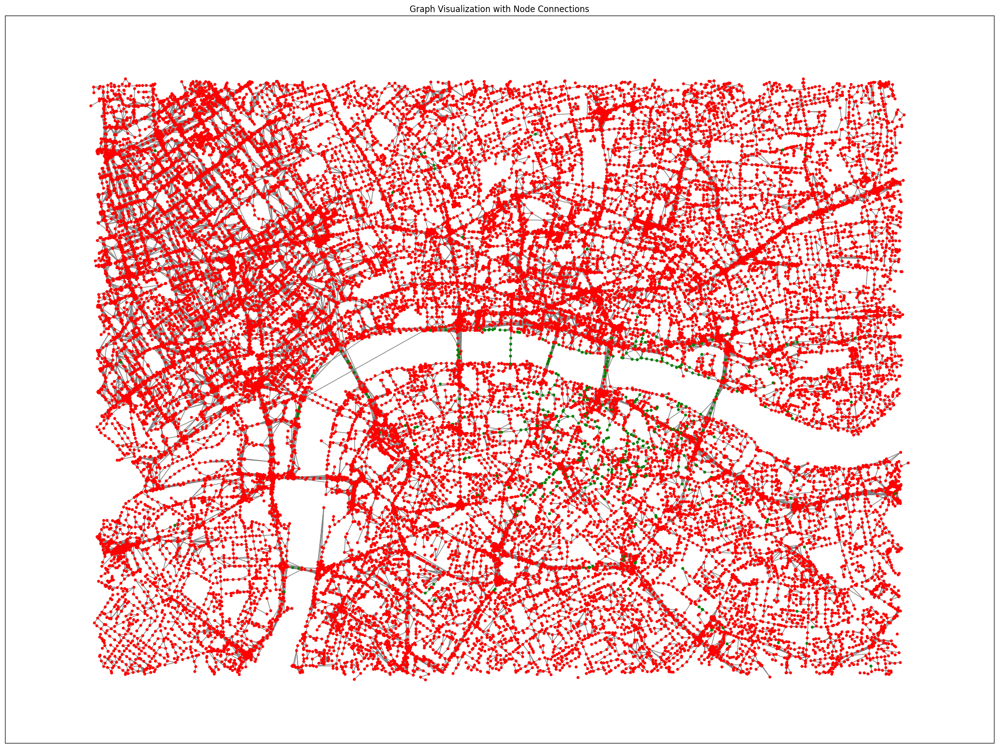

In [65]:


def draw_graph(G):
    # Create a larger plot
    plt.figure(figsize=(20, 15))  # Width, Height in inches

    # Positioning the nodes according to their geometry attributes
    pos = {node: (attr['geometry'].x, attr['geometry'].y) for node, attr in G.nodes(data=True)}
      # Define color by node attribute 'has_image' if it exists, else default to 'red' for virtual nodes
    # node_colors = ['green' if 'virtual' not in node else 'red' for node in G.nodes()]
    node_colors = ['green' if attr['visibility'] >0 else 'red' for node, attr in G.nodes(data=True)]


    # Drawing nodes with a size and color
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=10, alpha=1)
    # Drawing edges with a distinct color and style
    nx.draw_networkx_edges(G, pos, arrowstyle='-|>', arrowsize=10, edge_color='grey', style= '-')

    # Adding labels to nodes
    #labels = {node: node for node in G.nodes()}
    #nx.draw_networkx_labels(G, pos, labels, font_size=12)

    # Set plot options
    plt.title('Graph Visualization with Node Connections')
    #plt.xlabel('Longitude')
    #plt.ylabel('Latitude')
    #plt.grid(True)
    #plt.axis('equal')  # This ensures that distance in x and y are equally represented
    plt.tight_layout()
    plt.show()
    

# Assuming G is your graph created from previous steps
draw_graph(G)


#### visible nodes and their neighbours

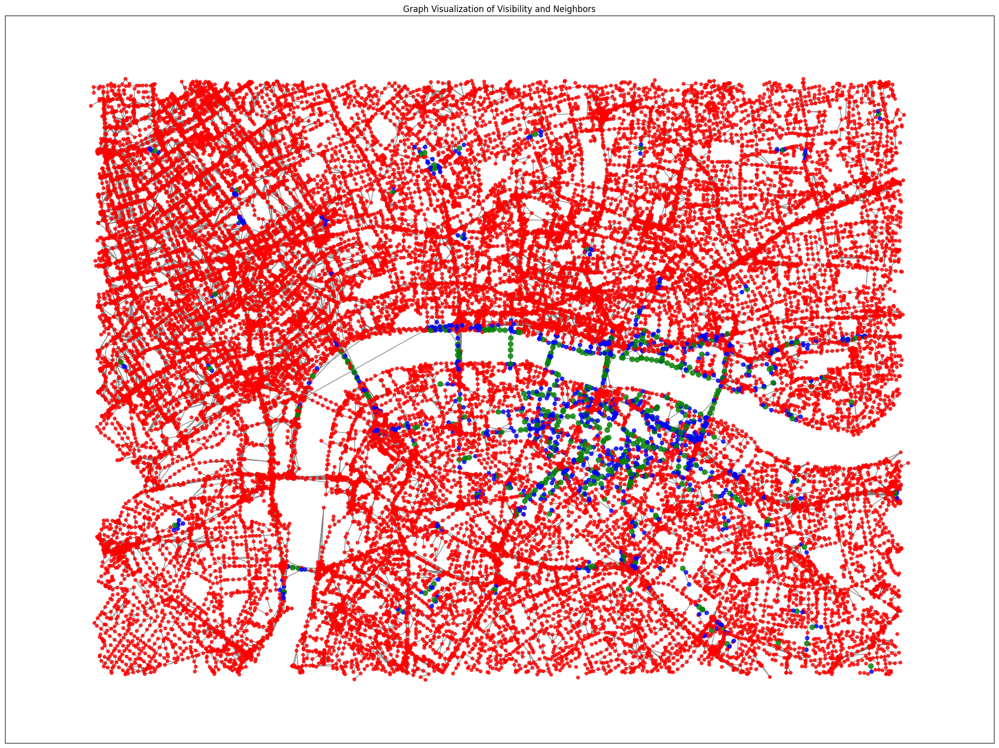

In [67]:
import networkx as nx
import matplotlib.pyplot as plt

def visualize_neighbors(G):
    plt.figure(figsize=(20, 15))

    # Positioning the nodes according to their geometry attributes
    pos = {node: (attr['geometry'].x, attr['geometry'].y) for node, attr in G.nodes(data=True)}

    # Find nodes where visibility > 0
    filtered_nodes = [node for node, attr in G.nodes(data=True) if attr.get('visibility', 0) > 0]

    # Find neighbors of these filtered nodes (1 step distance)
    neighbor_nodes = set()
    for node in filtered_nodes:
        neighbors = G.neighbors(node)
        neighbor_nodes.update(neighbors)

    # Remove the original filtered nodes from the neighbors set to avoid duplicating in visualization
    neighbor_nodes.difference_update(filtered_nodes)

    # Node colors and sizes based on type (filtered vs neighbors)
    node_colors = []
    node_sizes = []
    for node in G.nodes():
        if node in filtered_nodes:
            node_colors.append('green')  # Original filtered nodes in blue
            node_sizes.append(50)
        elif node in neighbor_nodes:
            node_colors.append('blue')  # Neighbors in green
            node_sizes.append(30)
        else:
            node_colors.append('red')  # Other nodes in red
            node_sizes.append(20)

    # Drawing nodes
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.8)

    # Drawing edges
    nx.draw_networkx_edges(G, pos, edge_color='grey', style='-')

    # Optional: Drawing labels for filtered nodes and their neighbors
    #labels = {node: node for node in filtered_nodes}
    #labels.update({node: node for node in neighbor_nodes})
    #nx.draw_networkx_labels(G, pos, labels=labels, font_size=12)

    plt.title('Graph Visualization of Visibility and Neighbors')
    plt.tight_layout()
    plt.show()

# Assuming G is your graph created from previous steps
visualize_neighbors(G)


#### Smooth neighbours as step distance

C:\Users\zicheng\AppData\Local\Temp\ipykernel_12576\2004451096.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


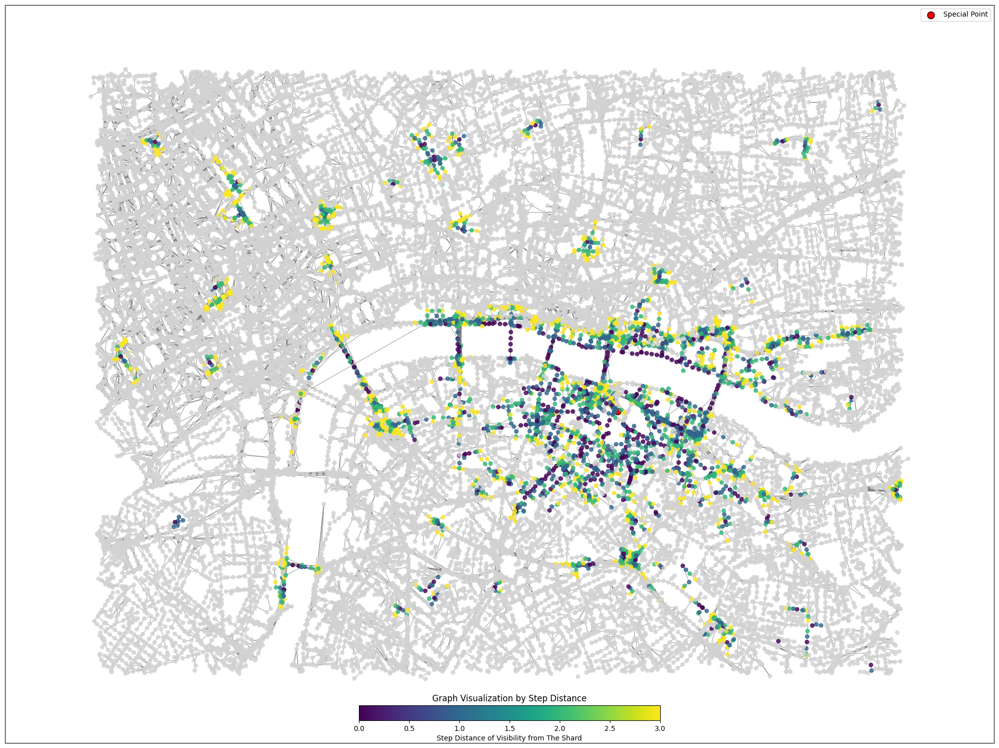

In [68]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def visualize_step_distances(G, max_distance=3, special_point=None):
    fig, ax = plt.subplots(figsize=(20, 15))

    # Positioning the nodes according to their geometry attributes
    pos = {node: (attr['geometry'].x, attr['geometry'].y) for node, attr in G.nodes(data=True)}

    # If a special point is provided, include it in the positions dictionary
    if special_point:
        pos['special_point'] = (special_point['longitude'], special_point['latitude'])

    # Find nodes where visibility > 0
    source_nodes = [node for node, attr in G.nodes(data=True) if attr.get('visibility', 0) > 0]

    # Use BFS to find nodes up to max_distance steps away
    node_distances = {}
    for source in source_nodes:
        distances = nx.single_source_shortest_path_length(G, source, cutoff=max_distance)
        for node, distance in distances.items():
            if node in node_distances:
                node_distances[node] = min(node_distances[node], distance)
            else:
                node_distances[node] = distance

    # Assign colors based on distance using a colormap
    cmap = plt.get_cmap('viridis')
    norm = mcolors.Normalize(vmin=0, vmax=max_distance)
    node_colors = [cmap(norm(node_distances[node])) if node in node_distances else 'lightgray' for node in G.nodes()]

    # Drawing nodes with colors reflecting their distances
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=30, alpha=0.8, ax=ax)

    # Drawing edges
    nx.draw_networkx_edges(G, pos, edge_color='grey', style='-', ax=ax, alpha = 0.6)

    # Draw the special point if provided
    if special_point:
        ax.scatter([special_point['longitude']], [special_point['latitude']], color='red', s=100, edgecolor='black', label='Special Point')
        ax.legend()

    # Optional: Add colorbar for distances
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar_ax = fig.add_axes([0.36, 0.04, 0.3, 0.02],  )  # This is the [left, bottom, width, height] for the colorbar
    plt.colorbar(sm, cax=cbar_ax, label='Step Distance of Visibility from The Shard', location = 'bottom')

    plt.title('Graph Visualization by Step Distance')
    plt.tight_layout()
    plt.show()
    
# plot the central target
central_lat = 51.50462497710506
central_lon = -0.08652726915106525
transformer = Transformer.from_crs("EPSG:4326", "EPSG:27700", always_xy=True)
central_x, central_y = transformer.transform(central_lon, central_lat)
special_point = {'latitude': central_y, 'longitude': central_x}
# Assuming G is your graph created from previous steps
visualize_step_distances(G,special_point=special_point )

# Multiple landmark visibility

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point, LineString
from pyproj import Transformer, Proj
import os
import glob
import shutil
from pyproj import Proj, transform
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import osmnx as ox
from networkx import closeness_centrality
import momepy
## Import SVI location points in central london
import pandas as pd
from shapely.wkt import loads

In [2]:
results_gdf = gpd.read_file('data/graph_building/london_10_landmarks/0114_inference_result_london_10_landmarks.gpkg')

results_gdf['color_id'] = 0
results_gdf.loc[results_gdf.detected=="tensor(True, device='cuda:0')",'color_id'] = 1

In [3]:
results_gdf = results_gdf.to_crs(27700)
results_gdf.detected.value_counts()

False                             140168
0                                   3000
tensor(True, device='cuda:0')       1619
tensor(False, device='cuda:0')         3
Name: detected, dtype: int64

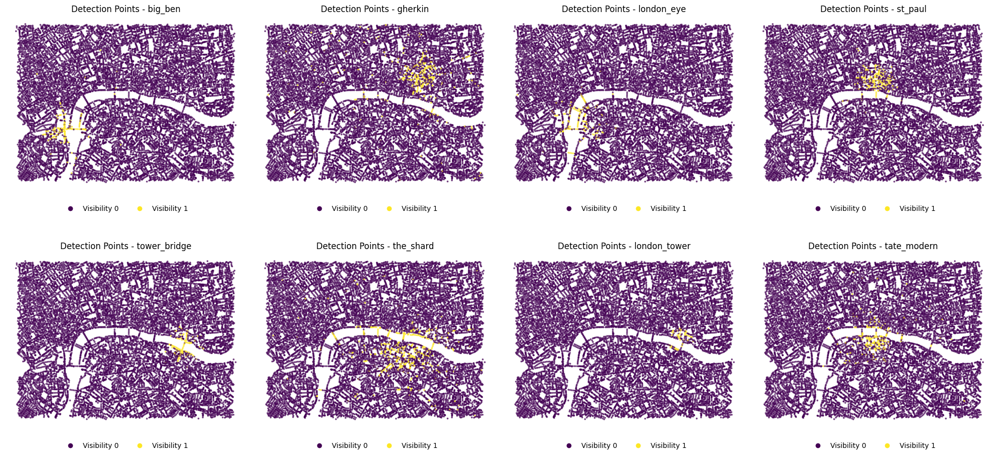

In [4]:
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Getting unique landmarks
unique_landmarks = results_gdf['query'].unique()[:8]

# Setting up the subplot grid
n_landmarks = len(unique_landmarks)
n_rows = (n_landmarks + 3) // 4  # Ensure enough rows to fit all plots
fig, axs = plt.subplots(n_rows, 4, figsize=(20, n_rows * 5))

# Flattening the axis array for easy iteration
axs = axs.flatten()

# Manually define the Viridis extreme colors for consistency
viridis_low = "#440154"   # Dark Purple (Start of Viridis)
viridis_high = "#FDE725"  # Bright Yellow-Green (End of Viridis)
color_mapping = {0: viridis_low, 1: viridis_high}

for idx, landmark in enumerate(unique_landmarks):
    # Filter results_gdf for current landmark
    landmark_gdf = results_gdf[results_gdf['query'] == landmark]
    
    # Plotting
    landmark_gdf.plot(ax=axs[idx], column='color_id', markersize=3, alpha=0.6, cmap='viridis')

    # Setting titles and labels
    axs[idx].set_title(f'Detection Points - {landmark}')
    axs[idx].set_xlabel('Longitude')
    axs[idx].set_ylabel('Latitude')

    # Removing axis for a cleaner look
    axs[idx].set_axis_off()

    # Custom legend (horizontal)
    handles = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[val], markersize=8, label=f'Visibility {val}')
        for val in color_mapping
    ]

    axs[idx].legend(handles=handles, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2, frameon=False)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


In [5]:
# Print the number of detected points that are not 0 for each landmark
for landmark in unique_landmarks:
    print(f"{landmark}: {len(results_gdf[(results_gdf['query'] == landmark) & (results_gdf['color_id'] != 0)])}")


big_ben: 141
gherkin: 305
london_eye: 142
st_paul: 159
tower_bridge: 95
the_shard: 464
london_tower: 46
tate_modern: 192


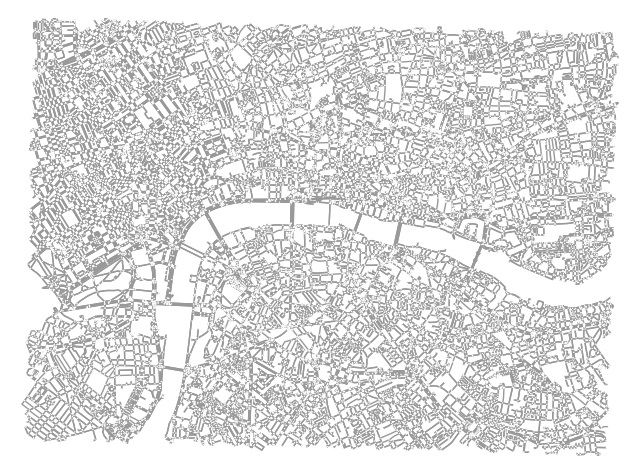

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [6]:
# Load the boundary file
import osmnx as ox


graph = ox.load_graphml('data/graph_building/london_10_landmarks/London_case_boundary_road_network.graphml')
        

ox.plot_graph(graph, node_size=1, edge_linewidth=1, bgcolor='w')




In [7]:
# extract only edges data from the road network and convert it as geodataframe
edges = ox.graph_to_gdfs(ox.get_undirected(graph), nodes=False, edges=True,
                                   node_geometry=False, fill_edge_geometry=True)
edges = edges.to_crs(27700).reset_index()

In [ ]:
# Load query images
query_images = {
    'big_ben': {
        'location': (51.50067742771776, -0.1245917078514397)  # Example (x, y) location in pixels within the image
    },
    'gherkin': {
        'location': (51.514425676412266, -0.08034253877566065)
    },
    # Add more query images as needed
    'london_eye': {
        'location': (51.50325678772387, -0.11968602374317167)
    },
    'st_paul': {
        'location': (51.51372488153867, -0.09835669261103407)
    },
    'tower_bridge': {
        'location': (51.505286271502925, -0.07557582210691857)
    },
    'the_shard': {
        'location': (51.50462497710506, -0.08652726915106525)
    },
      'london_tower': {
        'location': (51.50814912539999, -0.07593857137065564)
    },
        'tate_modern': {
        'location': (51.50790142258951, -0.0993475020370249)
    },
        'belfast': {
        'location': (51.50661247983305, -0.08137847973109241)
    },
    
        'walkie_talkie': {
        'location': (51.50661247983305, -0.08137847973109241)
    }
}


In [8]:
# create a location poin for the shard
from shapely.geometry import Point
import geopandas as gpd
import numpy as np
from pyproj import Proj, transform
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

import requests
import numpy as np
from PIL import Image
import torch


# Load query images
query_images = {
    'big_ben': {
        'image': Image.open('data/global_quairys/london_quiery/big_ben.jpg').convert("RGB"),
        #'height': 500,  # Example height in pixels
        'height': 136 +50,  # Example height in pixels
        'location': (51.50067742771776, -0.1245917078514397)  # Example (x, y) location in pixels within the image
    },
    'gherkin': {
        'image': Image.open('data/global_quairys/london_quiery/gherkin.jpg').convert("RGB"),
        'height': 180+150,
        'location': (51.514425676412266, -0.08034253877566065)
    },
    # Add more query images as needed
    'london_eye': {
        'image': Image.open('data/global_quairys/london_quiery/london_eye.jpg').convert("RGB"),
        'height': 135+50,
        'location': (51.50325678772387, -0.11968602374317167)
    },
    'st_paul': {
        'image': Image.open('data/global_quairys/london_quiery/st_paul.jpg').convert("RGB"),
        'height': 111+100,
        'location': (51.51372488153867, -0.09835669261103407)
    },
    'tower_bridge': {
        'image': Image.open('data/global_quairys/london_quiery/tower_bridge.jpg').convert("RGB"),
        'height': 65+20,
        'location': (51.505286271502925, -0.07557582210691857)
    },
    'the_shard': {
        'image': Image.open('data/global_quairys/london_quiery/the_shard.jpg').convert("RGB"),
        'height': 310+190,
        'location': (51.50462497710506, -0.08652726915106525)
    },
      'london_tower': {
        'image': Image.open('data/global_quairys/london_quiery/london_tower.jpg').convert("RGB"),
        'height': 27+13,
        'location': (51.50814912539999, -0.07593857137065564)
    },
        'tate_modern': {
        'image': Image.open('data/global_quairys/london_quiery/tate.jpg').convert("RGB"),
        'height': 99+50,
        'location': (51.50790142258951, -0.0993475020370249)
    },
        'belfast': {
        'image': Image.open('data/global_quairys/london_quiery/belfast.jpg').convert("RGB"),
        'height': 30,
        'location': (51.50661247983305, -0.08137847973109241)
    },
    
        'walkie_talkie': {
        'image': Image.open('data/global_quairys/london_quiery/walkie.jpg').convert("RGB"),
        'height': 160+100,
        'location': (51.50661247983305, -0.08137847973109241)
    }
}

query_list = []
point_list = []

for key,value in query_images.items():
    query = key
    latitude = value['location'][0]
    longitude = value['location'][1]
    point_geometry = Point(longitude, latitude)
    query_list.append(query)
    point_list.append(point_geometry)

df = pd.DataFrame([query_list,point_list]).T
df.columns = ['query','land_mark_geometry']
geometry_gdf = gpd.GeoDataFrame(df,geometry='land_mark_geometry', crs="EPSG:4326").to_crs(27700)
geometry_gdf



,query,land_mark_geometry
0,big_ben,POINT (530268.807 179638.037)
1,gherkin,POINT (533299.763 181246.469)
2,london_eye,POINT (530601.910 179933.598)
3,st_paul,POINT (532051.913 181135.894)
4,tower_bridge,POINT (533657.228 180238.851)
5,the_shard,POINT (532899.157 180145.375)
6,london_tower,POINT (533623.681 180556.540)
7,tate_modern,POINT (531999.992 180486.537)
8,belfast,POINT (533250.675 180375.746)
9,walkie_talkie,POINT (533250.675 180375.746)


In [9]:

edges_3000m = edges.copy()

for idx, row in edges_3000m.iterrows():   
    if isinstance(row['osmid'], int):
        # If 'osmid' is an integer, ensure it is handled as such
        edges_3000m['osmid'][idx] =str(row['osmid']) 
    
    if isinstance(row['osmid'], list):
    # Convert list to tuple (which is hashable) or to a string
       edges_3000m['osmid'][idx] = tuple(row['osmid'])  
        
def normalize_osmid(osmid):
    if isinstance(osmid, tuple):
        return ','.join(map(str, osmid))  # Convert tuple to comma-separated string
    return str(osmid)

edges_3000m['osmid'] = edges_3000m['osmid'].apply(normalize_osmid) 
edges_3000m = edges_3000m.dissolve(by='osmid', aggfunc='sum', as_index=False)

C:\Users\zicheng\AppData\Local\Temp\ipykernel_35540\1916369320.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edges_3000m['osmid'][idx] =str(row['osmid'])
C:\Users\zicheng\AppData\Local\Temp\ipykernel_35540\1916369320.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edges_3000m['osmid'][idx] = tuple(row['osmid'])
C:\Users\zicheng\AppData\Local\Temp\ipykernel_35540\1916369320.py:18: FutureWarning: The default value of numeric_only in aggfunc='sum' within pandas.DataFrameGroupBy.agg used in dissolve is deprecated. In pandas 2.0, numeric_only will default to False. Either specify numeric_only as additional argume

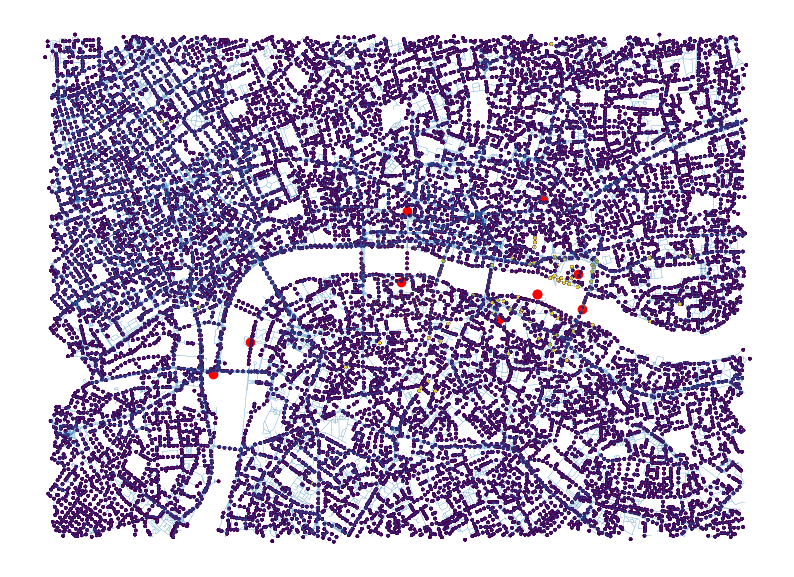

In [119]:
f, ax = plt.subplots(figsize=(10, 10))
edges_3000m.plot(ax=ax, linewidth=0.2)
geometry_gdf.plot(color = 'r', ax=ax,)
results_gdf.plot(ax=ax, column= 'color_id', markersize=2)
ax.set_axis_off()
plt.show()

In [121]:
results_gdf

,Unnamed: 0,pano_id,pano_lat,pano_lon,heading,roll,pitch,sampling_lat,sampling_lon,date,location,year,image_path,query,boxes,scores,detected,geometry,color_id
0,0,RCCRJuO_407FLaVim6Wf2w,51.492687,-0.098575,5.884931,6.268285,-0.002289,51.492724,-0.09858,2024-07,London,2024,data/London_10_landmarks/svi_images/London_cas...,big_ben,[],[],False,POINT (532097.545 178796.045),0
1,0,RCCRJuO_407FLaVim6Wf2w,51.492687,-0.098575,5.884931,6.268285,-0.002289,51.492724,-0.09858,2024-07,London,2024,data/London_10_landmarks/svi_images/London_cas...,gherkin,[],[],False,POINT (532097.545 178796.045),0
2,0,RCCRJuO_407FLaVim6Wf2w,51.492687,-0.098575,5.884931,6.268285,-0.002289,51.492724,-0.09858,2024-07,London,2024,data/London_10_landmarks/svi_images/London_cas...,london_eye,[],[],False,POINT (532097.545 178796.045),0
3,0,RCCRJuO_407FLaVim6Wf2w,51.492687,-0.098575,5.884931,6.268285,-0.002289,51.492724,-0.09858,2024-07,London,2024,data/London_10_landmarks/svi_images/London_cas...,st_paul,[],[],False,POINT (532097.545 178796.045),0
4,0,RCCRJuO_407FLaVim6Wf2w,51.492687,-0.098575,5.884931,6.268285,-0.002289,51.492724,-0.09858,2024-07,London,2024,data/London_10_landmarks/svi_images/London_cas...,tower_bridge,[],[],False,POINT (532097.545 178796.045),0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144785,14478,XpHnVlMcVZ77kH4L4yZzdg,51.493454,-0.095850,5.206117,0.089783,0.189174,51.493262,-0.09599,2023-06,London,2023,data/London_10_landmarks/svi_images/London_cas...,the_shard,[],[],False,POINT (532284.499 178886.325),0
144786,14478,XpHnVlMcVZ77kH4L4yZzdg,51.493454,-0.095850,5.206117,0.089783,0.189174,51.493262,-0.09599,2023-06,London,2023,data/London_10_landmarks/svi_images/London_cas...,london_tower,[],[],False,POINT (532284.499 178886.325),0
144787,14478,XpHnVlMcVZ77kH4L4yZzdg,51.493454,-0.095850,5.206117,0.089783,0.189174,51.493262,-0.09599,2023-06,London,2023,data/London_10_landmarks/svi_images/London_cas...,tate_modern,[],[],False,POINT (532284.499 178886.325),0
144788,14478,XpHnVlMcVZ77kH4L4yZzdg,51.493454,-0.095850,5.206117,0.089783,0.189174,51.493262,-0.09599,2023-06,London,2023,data/London_10_landmarks/svi_images/London_cas...,belfast,[],[],False,POINT (532284.499 178886.325),0


In [10]:
results_gdf_summary_gdf = results_gdf.copy()

In [11]:
results_gdf_wide = results_gdf.pivot_table(index=['pano_id','geometry'], columns='query', values='color_id').reset_index()
results_gdf_wide = gpd.GeoDataFrame(results_gdf_wide, geometry = 'geometry')
results_gdf_wide

query,pano_id,geometry,belfast,big_ben,gherkin,london_eye,london_tower,st_paul,tate_modern,the_shard,tower_bridge,walkie_talkie
0,--Ert5c5rut1tZhptKvVDg,POINT (529810.878 180363.013),0,0,0,0,0,0,0,0,0,0
1,--rR7M6F-w1cf49w0C9d5A,POINT (532564.892 179478.662),0,0,0,0,0,0,0,0,0,0
2,-05_wJJ81AbMsAT2FunZMA,POINT (534753.783 180294.129),0,0,0,0,0,0,0,0,0,0
3,-09YqX3dRpGhD2ER-L3gjg,POINT (529340.657 180476.357),0,0,0,0,0,0,0,0,0,0
4,-0NvlWoVYU0lVX6RlIvu8w,POINT (532725.296 181723.916),0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
14474,zyPiCdFq7V4trPH1-JFcjA,POINT (533191.463 180024.574),0,0,0,0,0,0,0,1,0,0
14475,zyTbEMbn7dqbogwDcePOLw,POINT (531380.508 178813.343),0,0,0,0,0,0,0,0,0,0
14476,zzN9yiLXYMTz-MD8hjOueg,POINT (531857.241 181712.456),0,0,0,0,0,0,0,0,0,0
14477,zzU3GfpTt3WWbaiLMLN4AQ,POINT (534951.326 180606.362),0,0,0,0,0,0,0,0,0,0


### SVI and the road it belongs to

In [12]:
#edges_3000m_SVI = gpd.sjoin_nearest(results_gdf_wide,edges_3000m[['geometry','osmid']] ).drop_duplicates('image_id').reset_index()
edges_3000m_SVI = gpd.sjoin_nearest(results_gdf,edges_3000m[['geometry','osmid']] ).drop_duplicates(['pano_id','query']).reset_index()
#edges_3000m_SVI = gpd.sjoin_nearest(results_gdf_summary_gdf,edges_3000m[['geometry','osmid']] ).drop_duplicates('image_id').reset_index()
edges_3000m_SVI = edges_3000m_SVI.merge(geometry_gdf, on = 'query')

edges_3000m_SVI.to_csv('data/graph_building/london_10_landmarks/0114_inference_result_joined_road.csv')
edges_3000m_SVI

,index,Unnamed: 0,pano_id,pano_lat,pano_lon,heading,roll,pitch,sampling_lat,sampling_lon,...,image_path,query,boxes,scores,detected,geometry,color_id,index_right,osmid,land_mark_geometry
0,0,0,RCCRJuO_407FLaVim6Wf2w,51.492687,-0.098575,5.884931,6.268285,-0.002289,51.492724,-0.098580,...,data/London_10_landmarks/svi_images/London_cas...,big_ben,[],[],False,POINT (532097.545 178796.045),0,1522,1069976330,POINT (530268.807 179638.037)
1,119190,11919,Zk9wl9JBIAmQVJ_TUq2Yrw,51.492504,-0.098413,2.798081,6.279795,0.005488,51.492527,-0.098452,...,data/London_10_landmarks/svi_images/London_cas...,big_ben,[],[],False,POINT (532109.315 178775.987),0,1522,1069976330,POINT (530268.807 179638.037)
2,10,1,AHMTKIewy7zIa0io4B7VwQ,51.492645,-0.098194,4.322697,0.107711,0.170834,51.492724,-0.098227,...,data/London_10_landmarks/svi_images/London_cas...,big_ben,[],[],False,POINT (532124.131 178792.042),0,19113,455952981,POINT (530268.807 179638.037)
3,12730,1273,cdCJstBp7iqjwdxtGS_Aag,51.492802,-0.097830,4.207063,0.067347,0.218833,51.492562,-0.097510,...,data/London_10_landmarks/svi_images/London_cas...,big_ben,[],[],False,POINT (532148.960 178810.181),0,19113,455952981,POINT (530268.807 179638.037)
4,57560,5756,YZbZIUz6tDanhVzIs1DwIw,51.492834,-0.097553,1.358105,0.061469,0.157925,51.492938,-0.097682,...,data/London_10_landmarks/svi_images/London_cas...,big_ben,[],[],False,POINT (532168.061 178814.227),0,19113,455952981,POINT (530268.807 179638.037)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144785,144709,14470,Nfj9gu-bougsvFO5QSo04A,51.494554,-0.100742,6.089055,6.258370,0.008322,51.494540,-0.100907,...,data/London_10_landmarks/svi_images/London_cas...,walkie_talkie,[],[],False,POINT (531941.757 178999.763),0,25868,"8032768,243978521,38893561",POINT (533250.675 180375.746)
144786,144729,14472,rn2Y5RoL0MbaPVYkFwZAQQ,51.494315,-0.100704,6.223941,6.256421,0.012718,51.494303,-0.100917,...,data/London_10_landmarks/svi_images/London_cas...,walkie_talkie,[],[],False,POINT (531945.055 178973.326),0,25868,"8032768,243978521,38893561",POINT (533250.675 180375.746)
144787,144739,14473,L_qof43g3Sd5NkLS4gz9GA,51.488546,-0.105676,3.656458,6.274728,-0.000195,51.488527,-0.105733,...,data/London_10_landmarks/svi_images/London_cas...,walkie_talkie,[],[],False,POINT (531616.528 178322.783),0,2304,"1109080834,768395637",POINT (533250.675 180375.746)
144788,144769,14476,mq3sCs97lAFgz6jtX1rBWg,51.496094,-0.104625,5.191352,6.279884,-0.003368,51.496097,-0.104565,...,data/London_10_landmarks/svi_images/London_cas...,walkie_talkie,[],[],False,POINT (531667.762 179164.023),0,15869,372964760,POINT (533250.675 180375.746)


In [13]:
len(edges_3000m_SVI.pano_id.unique())


14479

## Build Graph

### Build basic graph

In [14]:
from geopy.distance import geodesic
from tqdm import tqdm
import geopandas as gpd
import pandas as pd
from geopandas.tools import sjoin_nearest
import networkx as nx
from shapely.geometry import Point, MultiPoint, LineString,MultiLineString
from geopy.distance import geodesic
from tqdm import tqdm
import matplotlib.pyplot as plt
import networkx as nx

In [15]:


def get_start_end_points(geometry):
    """ Extracts the start and end points from a LineString or MultiLineString. """
    if geometry.type == 'MultiLineString':
        # Correctly handle MultiLineString objects using the geoms property
        start = Point(geometry.geoms[0].coords[0])  # Start point of the first part
        end = Point(geometry.geoms[-1].coords[-1])  # End point of the last part
    elif geometry.type == 'LineString':
        start = Point(geometry.coords[0])  # Start point of the LineString
        end = Point(geometry.coords[-1])   # End point of the LineString
    else:
        raise ValueError(f"Unhandled geometry type: {geometry.type}")
    return start, end

def find_connected_roads(roads_gdf, tolerance=10):
    #roads_gdf['osmid'] = roads_gdf['osmid'].apply(normalize_osmid)
    # Extract start and end points to handle MultiLineStrings
    roads_gdf['start'] = roads_gdf['geometry'].apply(lambda x: Point(x.geoms[0].coords[0]) if isinstance(x, MultiLineString) else Point(x.coords[0]))
    roads_gdf['end'] = roads_gdf['geometry'].apply(lambda x: Point(x.geoms[-1].coords[-1]) if isinstance(x, MultiLineString) else Point(x.coords[-1]))

    # Create GeoDataFrames for endpoints
    starts = gpd.GeoDataFrame(roads_gdf[['osmid']], geometry=roads_gdf['start'])
    ends = gpd.GeoDataFrame(roads_gdf[['osmid']], geometry=roads_gdf['end'])
    endpoints = pd.concat([starts, ends])

    # Convert concatenated DataFrame to GeoDataFrame
    endpoints = gpd.GeoDataFrame(endpoints, geometry='geometry', crs=roads_gdf.crs)  # Ensure CRS is consistent

    # Create a spatial index
    endpoint_sindex = endpoints.sindex

    # Find intersecting points
    road_connections = []
    checked_pairs = set()

    for idx, road in endpoints.iterrows():
        possible_matches_index = list(endpoint_sindex.intersection(road['geometry'].buffer(tolerance).bounds))
        possible_matches = endpoints.iloc[possible_matches_index]
        for _, match in possible_matches.iterrows():
            pair = tuple(sorted([road['osmid'], match['osmid']]))
            if road['osmid'] != match['osmid'] and pair not in checked_pairs:
                checked_pairs.add(pair)
                road_connections.append(pair)

    return road_connections

def calculate_distance(point1, point2):
    return point1.distance(point2)






In [27]:


def get_start_end_points(geometry):
    """ Extracts the start and end points from a LineString or MultiLineString. """
    if geometry.type == 'MultiLineString':
        # Correctly handle MultiLineString objects using the geoms property
        start = Point(geometry.geoms[0].coords[0])  # Start point of the first part
        end = Point(geometry.geoms[-1].coords[-1])  # End point of the last part
    elif geometry.type == 'LineString':
        start = Point(geometry.coords[0])  # Start point of the LineString
        end = Point(geometry.coords[-1])   # End point of the LineString
    else:
        raise ValueError(f"Unhandled geometry type: {geometry.type}")
    return start, end

def find_connected_roads(roads_gdf, tolerance=10):
    #roads_gdf['osmid'] = roads_gdf['osmid'].apply(normalize_osmid)
    # Extract start and end points to handle MultiLineStrings
    roads_gdf['start'] = roads_gdf['geometry'].apply(lambda x: Point(x.geoms[0].coords[0]) if isinstance(x, MultiLineString) else Point(x.coords[0]))
    roads_gdf['end'] = roads_gdf['geometry'].apply(lambda x: Point(x.geoms[-1].coords[-1]) if isinstance(x, MultiLineString) else Point(x.coords[-1]))

    # Create GeoDataFrames for endpoints
    starts = gpd.GeoDataFrame(roads_gdf[['osmid']], geometry=roads_gdf['start'])
    ends = gpd.GeoDataFrame(roads_gdf[['osmid']], geometry=roads_gdf['end'])
    endpoints = pd.concat([starts, ends])

    # Convert concatenated DataFrame to GeoDataFrame
    endpoints = gpd.GeoDataFrame(endpoints, geometry='geometry', crs=roads_gdf.crs)  # Ensure CRS is consistent

    # Create a spatial index
    endpoint_sindex = endpoints.sindex

    # Find intersecting points
    road_connections = []
    checked_pairs = set()

    for idx, road in endpoints.iterrows():
        possible_matches_index = list(endpoint_sindex.intersection(road['geometry'].buffer(tolerance).bounds))
        possible_matches = endpoints.iloc[possible_matches_index]
        for _, match in possible_matches.iterrows():
            pair = tuple(sorted([road['osmid'], match['osmid']]))
            if road['osmid'] != match['osmid'] and pair not in checked_pairs:
                checked_pairs.add(pair)
                road_connections.append(pair)

    return road_connections

def calculate_distance(point1, point2):
    return point1.distance(point2)

def build_graph_with_spatial_index(roads_gdf, images_gdf, road_connections):
    G = nx.Graph()
    roads_gdf['osmid'] = roads_gdf['osmid'].apply(normalize_osmid)  # Normalize osmid for consistency
    images_gdf['osmid'] = images_gdf['osmid'].apply(normalize_osmid)  # Normalize osmid for consistency
    
    # Dictionary to store virtual nodes and real images
    virtual_nodes = {}
    image_nodes = {}

    for osmid, group in roads_gdf.groupby('osmid'):
        has_images = not images_gdf[images_gdf['osmid'] == osmid].empty

        if has_images:
            sorted_group = images_gdf[images_gdf['osmid'] == osmid].sort_values(by=['latitude', 'longitude'])
            #print(f"Images found for road {osmid}: {len(sorted_group)} images")
            # Add real image nodes
            last_node = None
            for idx, row in sorted_group.iterrows():
                G.add_node(row['pano_id'], geometry=row['geometry'], visibility = row['color_id'],)
                if last_node is not None:
                    G.add_edge(last_node, row['pano_id'])
                last_node = row['pano_id']
            image_nodes[osmid] = (sorted_group.iloc[0]['pano_id'], sorted_group.iloc[-1]['pano_id'])
        else:
            # Add a virtual node at the midpoint of the road
            midpoint = group['geometry'].iloc[0].interpolate(0.5, normalized=True)
            virtual_node_id = f"virtual_{osmid}"
            # here for all the virtual node, the visibility is defined as -1
            G.add_node(virtual_node_id, geometry=midpoint, visibility = -1)
            virtual_nodes[osmid] = virtual_node_id
            #print(f"Virtual node added for road {osmid} at {midpoint}")
    #print("Virtual nodes added:", virtual_nodes)
    # Connect nodes based on road connections
    for road1, road2 in road_connections:
        # Both roads have image nodes
        if road1 in image_nodes and road2 in image_nodes:
            end1 = image_nodes[road1]
            end2 = image_nodes[road2]
            # Connect nearest endpoints
            closest_pair = min([(i1, i2) for i1 in end1 for i2 in end2], key=lambda pair: calculate_distance(G.nodes[pair[0]]['geometry'], G.nodes[pair[1]]['geometry']))
            G.add_edge(*closest_pair)
        
        # Road1 has image nodes and Road2 has virtual node
        elif road1 in image_nodes and road2 in virtual_nodes:
            nearest_image_id = min(image_nodes[road1], key=lambda x: calculate_distance(G.nodes[x]['geometry'], G.nodes[virtual_nodes[road2]]['geometry']))
            G.add_edge(nearest_image_id, virtual_nodes[road2])
        
        # Road2 has image nodes and Road1 has virtual node
        elif road1 in virtual_nodes and road2 in image_nodes:
            nearest_image_id = min(image_nodes[road2], key=lambda x: calculate_distance(G.nodes[x]['geometry'], G.nodes[virtual_nodes[road1]]['geometry']))
            G.add_edge(virtual_nodes[road1], nearest_image_id)
        
        # Both roads have virtual nodes
        elif road1 in virtual_nodes and road2 in virtual_nodes:
            G.add_edge(virtual_nodes[road1], virtual_nodes[road2])

    return G


In [28]:


def draw_graph(G):
    # Create a larger plot
    plt.figure(figsize=(15, 15))  # Width, Height in inches

    # Positioning the nodes according to their geometry attributes
    pos = {node: (attr['geometry'].x, attr['geometry'].y) for node, attr in G.nodes(data=True)}
      # Define color by node attribute 'has_image' if it exists, else default to 'red' for virtual nodes
    # node_colors = ['green' if 'virtual' not in node else 'red' for node in G.nodes()]
    node_colors = [
        'green' if attr['visibility'] > 0 else
        'red' if attr['visibility'] == 0 else
        'grey'
        for node, attr in G.nodes(data=True)
    ]

    # Drawing nodes with a size and color
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=10, alpha=1)
    # Drawing edges with a distinct color and style
    nx.draw_networkx_edges(G, pos, arrowstyle='-|>', arrowsize=10, edge_color='grey', style= '-')

    # Adding labels to nodes
    #labels = {node: node for node in G.nodes()}
    #nx.draw_networkx_labels(G, pos, labels, font_size=12)

    # Set plot options
    plt.title('Graph Visualization with Node Connections')
    #plt.xlabel('Longitude')
    #plt.ylabel('Latitude')
    #plt.grid(True)
    #plt.axis('equal')  # This ensures that distance in x and y are equally represented
    plt.tight_layout()
    plt.show()
    


In [29]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def visualize_step_distances(G, max_distance=5, special_point=None):
    fig, ax = plt.subplots(figsize=(15, 15))

    # Positioning the nodes according to their geometry attributes
    pos = {node: (attr['geometry'].x, attr['geometry'].y) for node, attr in G.nodes(data=True)}

    # If a special point is provided, include it in the positions dictionary
    if special_point:
        pos['special_point'] = (special_point['longitude'], special_point['latitude'])

    # Find nodes where visibility > 0
    source_nodes = [node for node, attr in G.nodes(data=True) if attr.get('visibility', 0) > 0]

    # Use BFS to find nodes up to max_distance steps away
    node_distances = {}
    for source in source_nodes:
        distances = nx.single_source_shortest_path_length(G, source, cutoff=max_distance)
        for node, distance in distances.items():
            if node in node_distances:
                node_distances[node] = min(node_distances[node], distance)
            else:
                node_distances[node] = distance

    # Assign colors based on distance using a colormap
    cmap = plt.get_cmap('viridis')
    norm = mcolors.Normalize(vmin=0, vmax=max_distance)
    node_colors = [cmap(norm(node_distances[node])) if node in node_distances else 'lightgray' for node in G.nodes()]

    # Drawing nodes with colors reflecting their distances
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=30, alpha=0.8, ax=ax)

    # Drawing edges
    nx.draw_networkx_edges(G, pos, edge_color='grey', style='-', ax=ax, alpha = 0.6)

    # Draw the special point if provided
    if special_point:
        ax.scatter([special_point['longitude']], [special_point['latitude']], color='red', s=100, edgecolor='black', label='Special Point')
        ax.legend()

    # Optional: Add colorbar for distances
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar_ax = fig.add_axes([0.36, 0.04, 0.3, 0.02],  )  # This is the [left, bottom, width, height] for the colorbar
    plt.colorbar(sm, cax=cbar_ax, label='Step Distance of Visibility from The Landmark', location = 'bottom')

    plt.title('Graph Visualization by Step Distance')
    plt.tight_layout()
    plt.show()
    


In [18]:
def export_graph_data(G):
    # Export node data
    node_data = [
        {
            'node_id': node,
            'latitude': attr['geometry'].y,
            'longitude': attr['geometry'].x,
            'visibility': attr.get('visibility', None)
        }
        for node, attr in G.nodes(data=True)
    ]
    node_df = pd.DataFrame(node_data)
    #node_df.to_csv(f"{output_path}_nodes.csv", index=False)

    # Export edge data
    edge_data = [
        {
            'source': edge[0],
            'target': edge[1],
            #'weight': edge_attr.get('weight', 1)  # Default weight is 1 if not provided
        }
        for edge in G.edges(data=True)
    ]
    edge_df = pd.DataFrame(edge_data)
    #edge_df.to_csv(f"{output_path}_edges.csv", index=False)
    return node_df,edge_df
    #print(f"Node and edge data exported to {output_path}_nodes.csv and {output_path}_edges.csv")

In [19]:

#edges_3000m_SVI = pd.read_csv('data/London_50m_svi_view_points/inference_result/0422_inference_result_joined_road.csv')
#edges_3000m_SVI['geometry'] = gpd.GeoSeries.from_wkt(edges_3000m_SVI['geometry'])
edges_3000m_SVI['longitude'] = [i.x for i in edges_3000m_SVI.geometry]
edges_3000m_SVI['latitude'] = [i.y for i in edges_3000m_SVI.geometry]

# Assuming that 'edges_3000m_SVI' is the roads GeoDataFrame and 'images_gdf' contains image data
road_connections = find_connected_roads(edges_3000m)

In [30]:
from tqdm import tqdm

svi_nodes_list = []
output_path = 'data/graph_building/london_10_landmarks/hetergenous_graph/hetergenous_graph'

# Initialize tqdm progress bar
landmark_queries = edges_3000m_SVI['query'].unique()
progress_bar = tqdm(landmark_queries, desc="Processing Landmarks", unit="landmark")

for i in progress_bar:
    svi_selected = edges_3000m_SVI[edges_3000m_SVI['query'] == i].reset_index()
    landmark_geometry = list(svi_selected.land_mark_geometry)[0]

    # Update the progress bar description to indicate the current landmark being processed
    progress_bar.set_description(f"Processing {i}")

    G = build_graph_with_spatial_index(edges_3000m, svi_selected, road_connections)
    node_df, edge_df = export_graph_data(G)
    node_df['landmark'] = i
    svi_nodes_list.append(node_df)

# Combine all nodes into a final DataFrame
svi_nodes_final_df = pd.concat(svi_nodes_list)

# Save results
edge_df.to_csv(f"{output_path}_edges.csv", index=False)
svi_nodes_final_df.to_csv(f"{output_path}_nodes.csv", index=False)

print("Graph building process completed.")


Processing walkie_talkie: 100%|█████████████████████████████████████████████████| 10/10 [16:57<00:00, 101.79s/landmark]


Graph building process completed.


In [34]:
svi_nodes_final_df

,node_id,latitude,longitude,visibility,landmark
0,virtual_100009526,182064.117851,530293.357058,-1,big_ben
1,smI5NVr3YGCHhZ2xGLeVgA,179189.464641,530929.651121,0,big_ben
2,rcT4e98neeJLvDqEKP0Ubw,179194.430290,530920.997963,0,big_ben
3,virtual_100015715,179545.109607,530990.224452,-1,big_ben
4,BXBbIrWOC9NE0HZa9PiXDg,179340.367282,531038.664527,0,big_ben
...,...,...,...,...,...
35457,RraQcNkpxyrO4_KGO73RvA,182366.902520,533369.496040,0,walkie_talkie
35458,fcoTfNB7iI7NLMjOd42ZGg,182374.525914,533390.701761,0,walkie_talkie
35459,I-5tk42WeTmyT_ELa-tXyw,182378.028812,533421.179421,0,walkie_talkie
35460,YYIQLGUuXq1NPXOMYY4yvQ,181060.346343,533621.101822,0,walkie_talkie
